In [1]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 51.7 MB/s eta 0:00:00


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Hyperparams Tuning & Feature Selection Results





In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
month_approach_results=pd.read_csv('/content/drive/MyDrive/Data/month_approach_results.csv')
overall_median_approach_results=pd.read_csv('/content/drive/MyDrive/Data/overall_median_approach_results.csv')

In [6]:
month_approach_results['Approach']='One Month Window'
overall_median_approach_results['Approach']='Overall Median'

In [7]:
df_combined = pd.concat([month_approach_results, overall_median_approach_results], ignore_index=True)

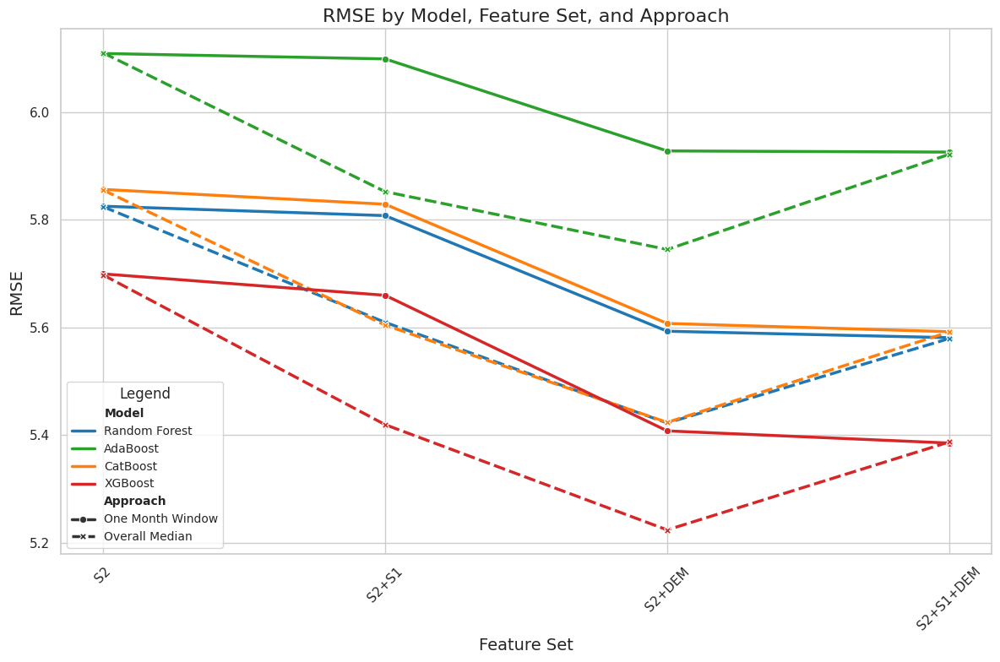

In [8]:
sns.set_theme(style="whitegrid")

# Define a custom color palette
custom_palette = {
    'Random Forest': '#1f77b4',  # Blue
    'AdaBoost': '#2ca02c',       # Green
    'CatBoost': '#ff7f0e',       # Orange
    'XGBoost': '#d62728',        # Red
}

# Create the plot
plt.figure(figsize=(12, 8))
sns.lineplot(
    data=df_combined,
    x="Features",
    y="RMSE",
    hue="Model",              # Different color for each model
    style="Approach",         # Different line styles for each approach
    markers=True,             # Add markers
    palette=custom_palette,   # Custom colors for models
    linewidth=2.5             # Thicker lines for better visibility
)

# Customize the plot
plt.title("RMSE by Model, Feature Set, and Approach", fontsize=16)
plt.xlabel("Feature Set", fontsize=14)
plt.ylabel("RMSE", fontsize=14)

# Customize the legend
legend = plt.legend(title="Legend", fontsize=10, title_fontsize=12, loc='lower left')
for i,text in enumerate(legend.get_texts()):
    if i == 0 or i==5:
      text.set_fontweight('bold')

plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


# Cross Validation Results

In [10]:
from sklearn.model_selection import KFold
import numpy as np
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
import ast
def Cross_Validation(data, features, target, model_type, params):

    # Extract features (X) and target (y) as NumPy arrays
    X = data[features].values
    y = data[target].values

    # K-Fold setup
    kf = KFold(n_splits=5, random_state=15, shuffle=True)

    # Lists to store predictions and ground truths
    pred_list = []
    gt_list = []

    # Perform K-Fold cross-validation
    for train_index, test_index in kf.split(X):
        X_train, X_valid = X[train_index], X[test_index]
        y_train, y_valid = y[train_index], y[test_index]

        # Initialize and train the model
        model = model_type(**params)
        model.fit(X_train, y_train)

        # Predict and store results
        pred = model.predict(X_valid)
        pred_list.append(pd.DataFrame(pred, columns=["Predictions"]))
        gt_list.append(pd.DataFrame(y_valid, columns=["Ground Truth"]))

    # Concatenate ground truths and predictions
    gt_df = pd.concat(gt_list, ignore_index=True)
    pred_df = pd.concat(pred_list, ignore_index=True)

    return gt_df, pred_df


In [11]:
params=overall_median_approach_results.loc[(overall_median_approach_results['Model']=='XGBoost') & (overall_median_approach_results['Features']=='S2+DEM'),'Best Params']

params = ast.literal_eval(params.values[0])
model=XGBRegressor
Features=[ 'B2','B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12',
  'NBR', 'NDMI', 'NDRE','NDVI', 'TasseledCapGreenness',
  'elevation', 'slope']
target='rh95'

In [12]:
data=pd.read_csv('/content/drive/MyDrive/Data/GEDI_S1_S2_DEM_Overall_Median.csv').dropna()

In [13]:
def exclude_outliers(data, target, min_percentile=0.05, max_percentile=99.5):
    min_threshold = np.percentile(data[target].to_numpy().astype(float), min_percentile)
    max_threshold = np.percentile(data[target].to_numpy().astype(float), max_percentile)
    print('min_threshold:', min_threshold)
    print('max_threshold:', max_threshold)
    return data[(data[target] >= min_threshold) & (data[target] <= max_threshold)]

data = exclude_outliers(data,target,min_percentile=0.05, max_percentile=99)

min_threshold: 1.9800000190734863
max_threshold: 36.290001


In [20]:
gt_df, pred_df= Cross_Validation(data, Features, target, model, params)

In [21]:
def plot_reg_res(title, gt, pred):
    fig, axs = plt.subplots(1, 1, figsize=(8, 6))
    plt.grid(True)

    # RMSE Calculation
    rmse = np.round(np.sqrt(mean_squared_error(gt, pred)), 2)

    # Scatter Plot
    scatter = axs.scatter(gt, pred, c=abs(gt - pred), cmap="viridis", s=80, alpha=0.5)

    # Linear Fit
    m, b = np.polyfit(gt, pred, 1)
    axs.plot(gt, m * gt + b, '-', color='red', label=f'Fit: y={m:.2f}x+{b:.2f}')

    # Perfect Fit Line
    axs.plot([gt.min(), gt.max()], [gt.min(), gt.max()], '--', color='gray', label='Ideal Fit')

    # Axis Limits
    axs.set_xlim(gt.min(), gt.max())
    axs.set_ylim(pred.min(), pred.max())

    # Labels and Title
    axs.set_xlabel('True Values')
    axs.set_ylabel('Predicted Values')
    axs.set_title(title)

    # Colorbar
    cb = fig.colorbar(scatter, ax=axs)
    cb.set_label("Error Magnitude")

    # Display RMSE
    axs.text(0.05, 0.05, f'RMSE = {rmse}', transform=axs.transAxes,
             fontsize=12, verticalalignment='bottom', horizontalalignment='left',
             bbox=dict(facecolor='white', alpha=0.5))

    # Legend
    axs.legend()

    plt.tight_layout()
    plt.show()


<ipython-input-21-be5a3fbecb92>:39: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


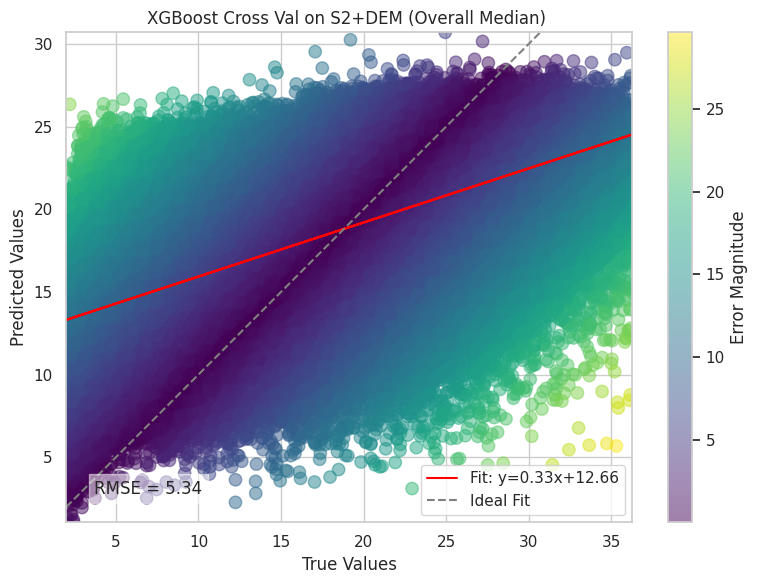

In [24]:
plot_reg_res('XGBoost Cross Val on S2+DEM (Overall Median) ',gt_df.values.flatten(), pred_df.values.flatten())

# Map Prediction & Plotting

In [14]:
import glob
import rasterio
from rasterio.merge import merge
import numpy as np
import matplotlib.pyplot as plt
from rasterio.transform import Affine
import matplotlib.colors as mcolors

In [15]:
import glob
import rasterio
from rasterio.merge import merge
from rasterio.transform import Affine
import matplotlib.colors as mcolors
from shapely.geometry import Point
import geopandas as gpd
i
def tiff_to_gdf(tiff_path):
    # Open the GeoTIFF file using rasterio
    with rasterio.open(tiff_path) as src:
        # Get the CRS of the raster (spatial reference)
        crs = src.crs
        band_names = src.descriptions
        # Read the bands into an array (you can modify this to get specific bands if needed)
        bands = []
        for i in range(1, src.count + 1):
            band_data = src.read(i)  # Read each band
            bands.append(band_data.flatten())  # Flatten to make it 1D

        # Combine all bands into a DataFrame
        band_df = pd.DataFrame(np.array(bands).T, columns=band_names)

        # Generate the coordinates for each pixel
        rows, cols = np.indices(band_data.shape)  # Indices for each pixel
        x, y = src.xy(rows, cols)  # Convert indices to coordinates

        # Flatten the coordinates and create a GeoDataFrame
        geometry = [Point(x[i], y[i]) for i in range(len(x.flatten()))]
        return gpd.GeoDataFrame(band_df, geometry=geometry, crs=crs)


def create_geotiff_from_gdf(gdf, output_path, reference_tiff_path):
    with rasterio.open(reference_tiff_path) as src:
        # Get metadata from the reference GeoTIFF
        profile = src.profile
        profile.update(dtype=rasterio.float32, count=1)

        # Create a new GeoTIFF file
        with rasterio.open(output_path, 'w', **profile) as dst:
            # Reshape the predicted values to the original raster dimensions
            predicted_values = gdf['CHM'].values.reshape(src.height, src.width)
            dst.write(predicted_values, 1)

In [67]:
def crop_nan(image, transform):
    """
    Crops the image to the area containing non-nodata values.

    Parameters:
    - image (np.ndarray): 3D numpy array with dimensions (bands, height, width).
    - transform (Affine): Affine transformation matrix of the image.

    Returns:
    - cropped_image (np.ndarray): Cropped image array.
    - cropped_transform (Affine): Updated affine transformation for the cropped image.
    """
    # Identify valid data across all bands by checking against nodata_value
    image=np.nan_to_num(image)
    valid_data_mask = np.any(image != 0, axis=0)

    # Identify rows and columns with any valid data
    rows_with_data = np.any(valid_data_mask, axis=1)
    cols_with_data = np.any(valid_data_mask, axis=0)

    min_row, max_row = np.where(rows_with_data)[0][[0, -1]]
    min_col, max_col = np.where(cols_with_data)[0][[0, -1]]

    # Crop the image to include only valid data and adjust the affine transform
    cropped_image = image[:, min_row:max_row+1, min_col:max_col+1]
    cropped_transform = transform * Affine.translation(min_col, min_row)

    return cropped_image, cropped_transform

def save_geotiff(image, transform, output_path, profile, dtype="float32"):
    """
    Saves a GeoTIFF file with the specified data type and transformation.

    Parameters:
    - image (np.ndarray): The image data array to save (shape: [bands, height, width]).
    - transform (Affine): Affine transformation matrix for the image.
    - output_path (str): File path to save the GeoTIFF.
    - profile (dict): Rasterio profile dictionary for the output file.
    - dtype (str): Data type to save the image as (default is "float32").
    """
    # Ensure the data type is compatible with GeoTIFF format
    supported_dtypes = ["uint8", "int8", "uint16", "int16", "int32", "float32","float64"]
    if dtype not in supported_dtypes:
        raise ValueError(f"Unsupported dtype '{dtype}'. Supported types are: {supported_dtypes}")

    # Update the profile to reflect the new data type and image dimensions
    profile.update({
        "height": image.shape[1],
        "width": image.shape[2],
        "transform": transform,
        "driver": "GTiff",
        "dtype": dtype
    })

    # Convert the image to the specified dtype if needed
    image = image.astype(dtype)

    # Write the image data to a GeoTIFF file
    with rasterio.open(output_path, 'w', **profile) as dest:
        dest.write(image)


In [17]:
import os
import glob
import numpy as np
import rasterio
from rasterio.merge import merge

def predict(model, tiles_dir,name_like, out_path):
    """
    Apply a machine learning model to predict CHM (Canopy Height Model) for input GeoTIFF tiles
    and generate a mosaic output.

    Args:
        model: Trained model to make predictions.
        tiles_dir: Directory containing input GeoTIFF tiles.
        out_path: Output path for the final mosaic GeoTIFF.
    """
    intermediate_paths = []  # Store paths to the intermediate predicted GeoTIFFs
    intermediate_dir = tiles_dir+'/'+name_like+'_predicted'
    os.makedirs(intermediate_dir, exist_ok=True)
    # Iterate over the input GeoTIFFs in the specified directory
    for tiff_path in glob.glob(f"{tiles_dir}/{name_like}*.tif"):
        # Generate an output path for the predicted GeoTIFF
        output_path = tiff_path.replace(tiles_dir,intermediate_dir)
        intermediate_paths.append(output_path)

        # Convert the GeoTIFF to a GeoDataFrame
        gdf = tiff_to_gdf(tiff_path)

        # Predict CHM values using the model
        gdf['CHM'] = model.predict(gdf[Features])

        # Handle missing data: Set CHM values to NaN where 'B11' is NaN
        gdf.loc[gdf['B11'].isna(), 'CHM'] = np.nan

        # Convert the GeoDataFrame back to a GeoTIFF
        create_geotiff_from_gdf(gdf, output_path, tiff_path)

    # Merge all the intermediate GeoTIFFs into a single mosaic
    mosaic, out_trans = merge([rasterio.open(path) for path in intermediate_paths])

    # Copy the profile (metadata) from the first input GeoTIFF
    with rasterio.open(intermediate_paths[0]) as src:
        profile = src.profile.copy()

    # Crop the mosaic to remove areas with only NaN values
    mosaic, out_trans = crop_nan(mosaic, out_trans)

    # Save the final mosaic GeoTIFF
    save_geotiff(mosaic,out_trans, out_path, profile)

    print(f"Prediction and mosaicking completed. Output saved at {out_path}.")


In [18]:
model=XGBRegressor(**params,random_state=15)
model.fit(data[Features], data[target])

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=10, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=15, ...)

In [52]:
predict(model, '/content/drive/MyDrive/Data','Onondaga', 'gh.tif')

Prediction and mosaicking completed. Output saved at gh.tif.


In [19]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import rasterio
import numpy as np

def visualize_geotiff(map_path, output_image_path):
    # Define the colormap using colors inspired by the uploaded image
    colors = [
        "#ffffb2",  # Pale yellow (0-5m)
        "#c2e699",  # Light green (5-10m)
        "#78c679",  # Medium green (10-15m)
        "#31a354",  # Dark green (15-20m)
        "#006837",  # Forest green (20-25m)
        "#004529",  # Very dark green (25-30m)
        "#002d1e"   # Deep dark green (30-35m)
    ]
    # Create a colormap and define boundaries for the color intervals
    cmap = mcolors.ListedColormap(colors)
    bounds = [0, 5, 10, 15, 20, 25, 30, 35]  # Boundaries for CHM height classes
    norm = mcolors.BoundaryNorm(bounds, cmap.N)

    # Open the GeoTIFF file
    with rasterio.open(map_path) as src:
        data = src.read(1)  # Read the first band of the raster
        data[data == 0] = np.nan  # Set 0 values to NaN for transparency

        # Set up the plot
        fig, ax = plt.subplots(figsize=(src.width / 100, src.height / 100), dpi=100)
        ax.imshow(data, cmap=cmap, norm=norm)  # Display raster data with the colormap

        # Add a colorbar
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax, fraction=0.025, pad=0.04)
        cbar.set_label('Canopy Height (m)')  # Label the colorbar

        # Remove axes for a clean visualization
        ax.axis('off')

        # Save the output image
        plt.savefig(output_image_path, bbox_inches='tight', pad_inches=0, transparent=True)
        plt.show()

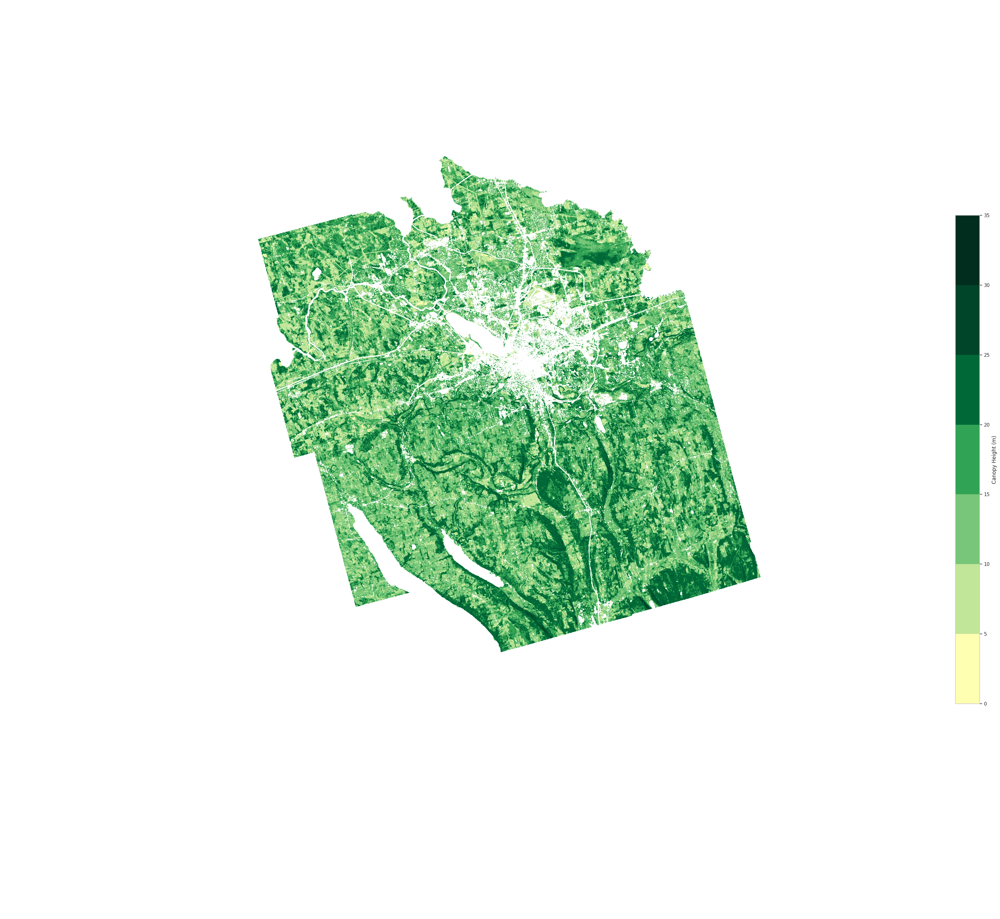

In [54]:
visualize_geotiff('Onondaga.tif', 'Onondaga.png')

In [20]:
predict(model, '/content/drive/MyDrive/Data','NY', 'NY.tif')

Prediction and mosaicking completed. Output saved at NY.tif.


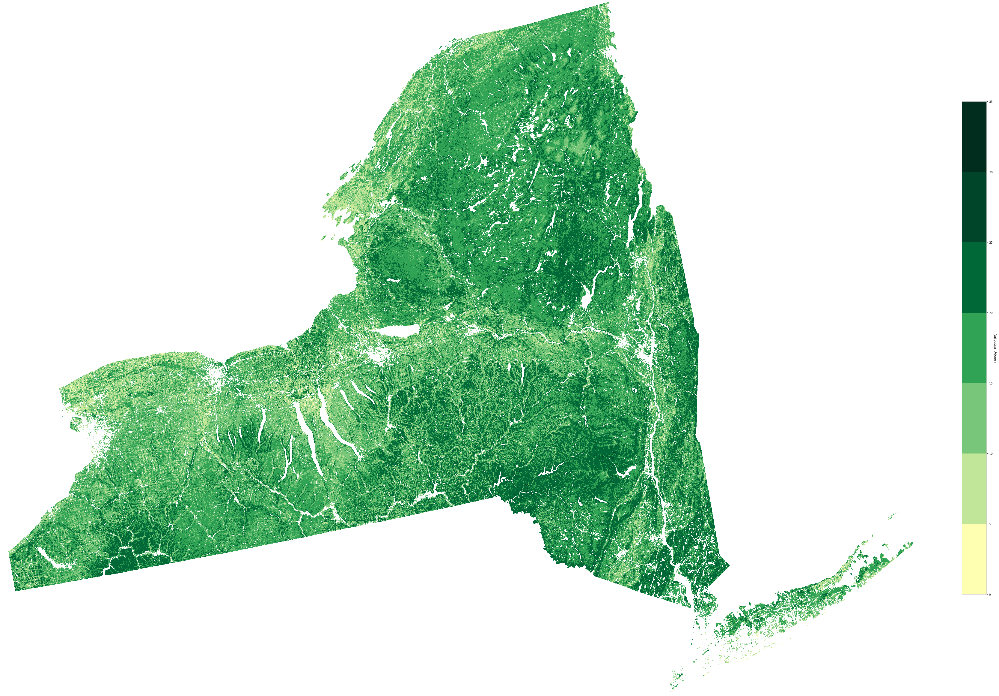

In [21]:
visualize_geotiff('NY.tif', 'NY.png')

In [22]:
predict(model, '/content/drive/MyDrive/Data','NH', 'NH.tif')

Prediction and mosaicking completed. Output saved at NH.tif.


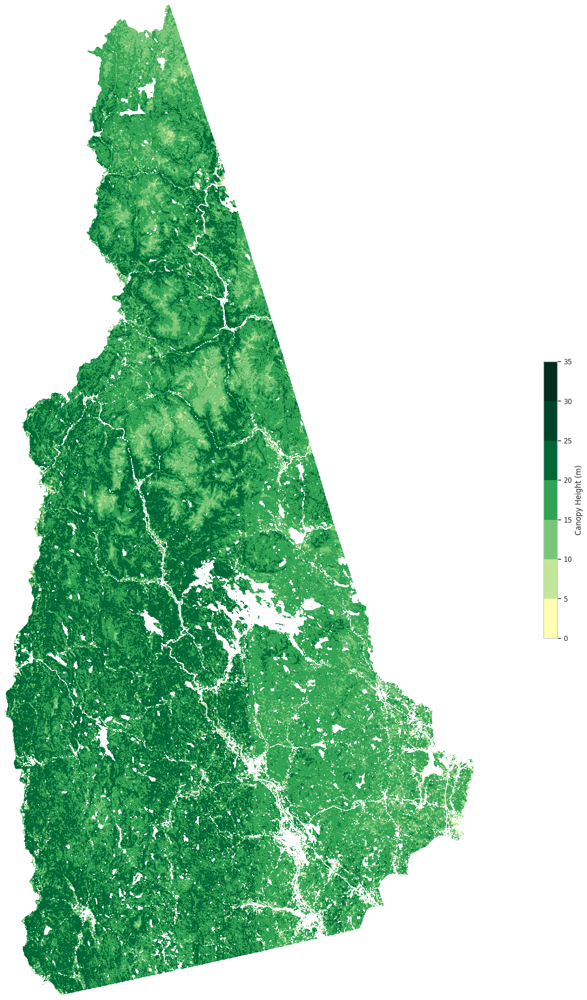

In [23]:
visualize_geotiff('NH.tif', 'NH.png')

In [24]:
predict(model, '/content/drive/MyDrive/Data','ME', 'ME.tif')

Prediction and mosaicking completed. Output saved at ME.tif.


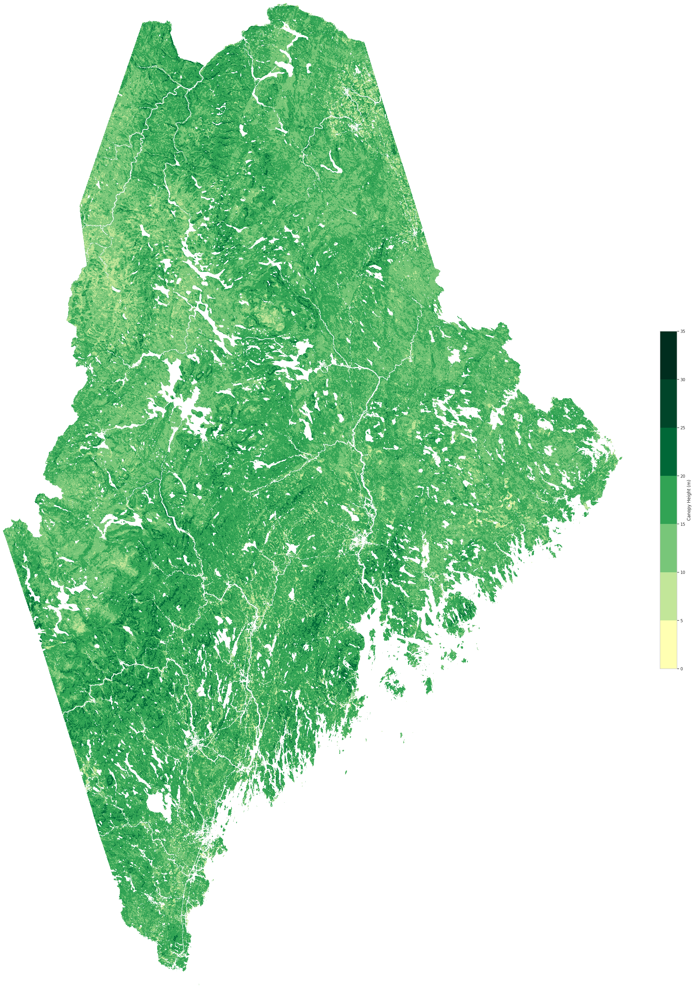

In [25]:
visualize_geotiff('ME.tif', 'ME.png')

In [26]:
predict(model, '/content/drive/MyDrive/Data','MA', 'MA.tif')

Prediction and mosaicking completed. Output saved at MA.tif.


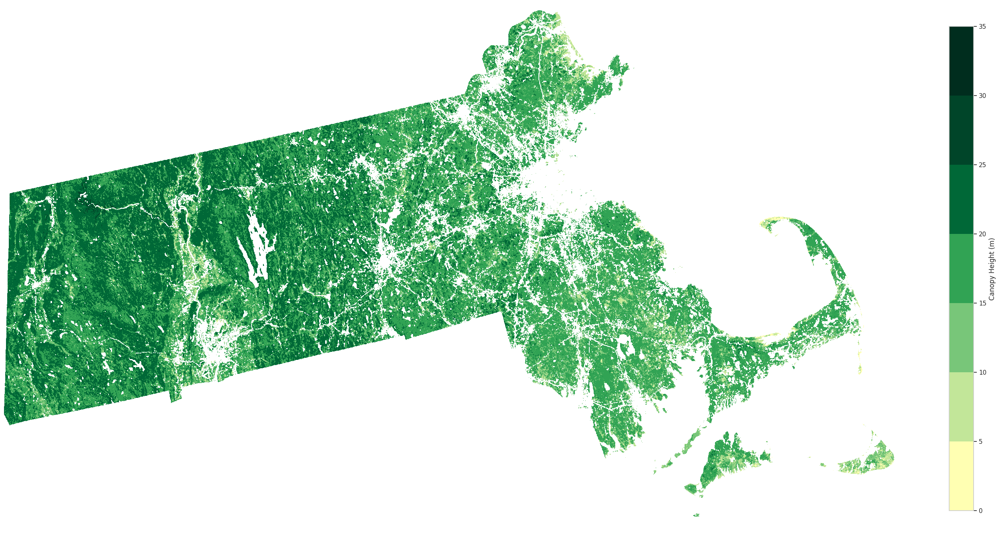

In [27]:
visualize_geotiff('MA.tif', 'MA.png')

In [28]:
predict(model, '/content/drive/MyDrive/Data','VT', 'VT.tif')

Prediction and mosaicking completed. Output saved at VT.tif.


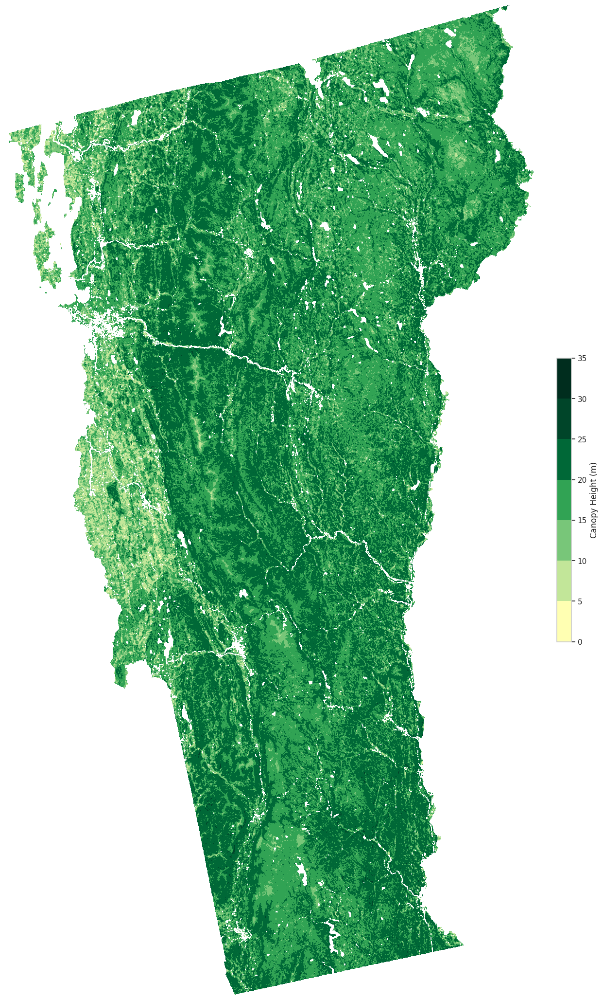

In [29]:
visualize_geotiff('VT.tif', 'VT.png')

In [30]:
predict(model, '/content/drive/MyDrive/Data','CT', 'CT.tif')

Prediction and mosaicking completed. Output saved at CT.tif.


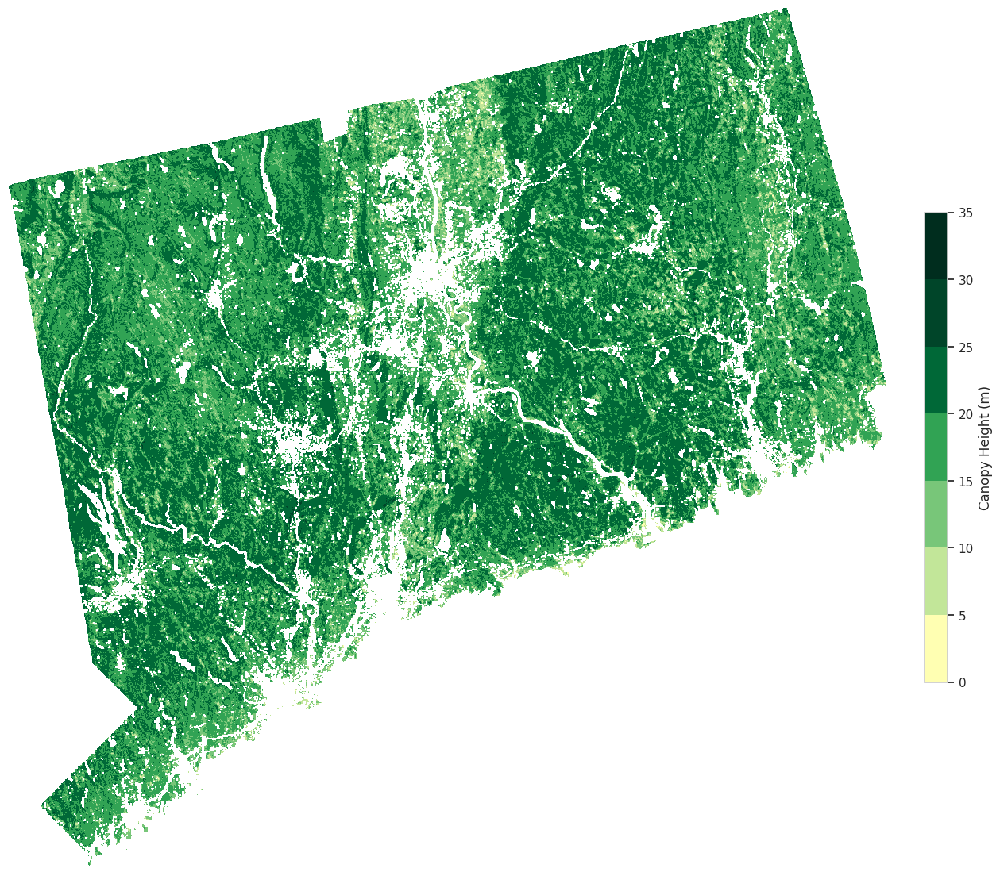

In [31]:
visualize_geotiff('CT.tif', 'CT.png')

In [32]:
predict(model, '/content/drive/MyDrive/Data','RI', 'RI.tif')

Prediction and mosaicking completed. Output saved at RI.tif.


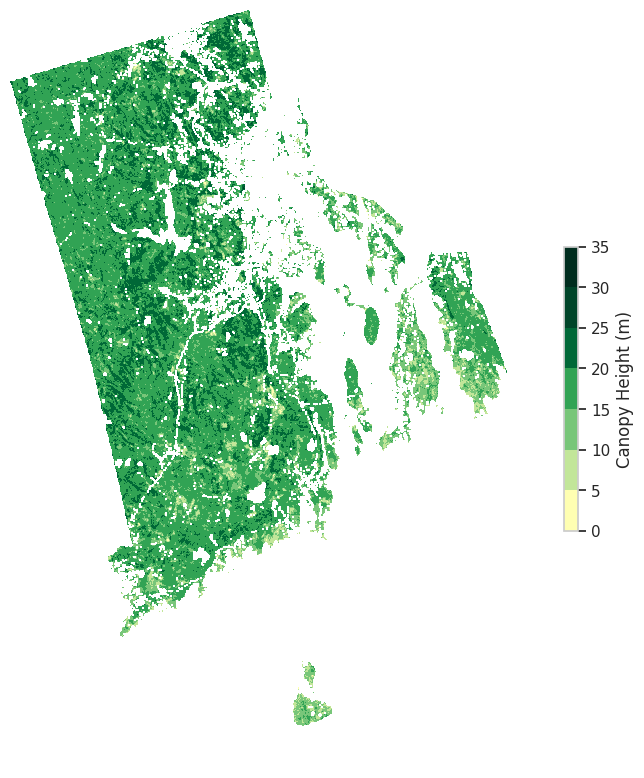

In [33]:
visualize_geotiff('RI.tif', 'RI.png')

In [80]:
mosaic, out_trans = merge(['NY.tif','NH.tif','MA.tif','ME.tif','VT.tif','CT.tif','RI.tif'],method='max',)
# Copy the profile (metadata) from the first input GeoTIFF
with rasterio.open('NY.tif') as src:
        profile = src.profile.copy()
# Crop the mosaic to remove areas with only NaN values
mosaic, out_trans = crop_nan(mosaic, out_trans)
# Save the final mosaic GeoTIFF
save_geotiff(mosaic,out_trans, 'NEUS.tif', profile)


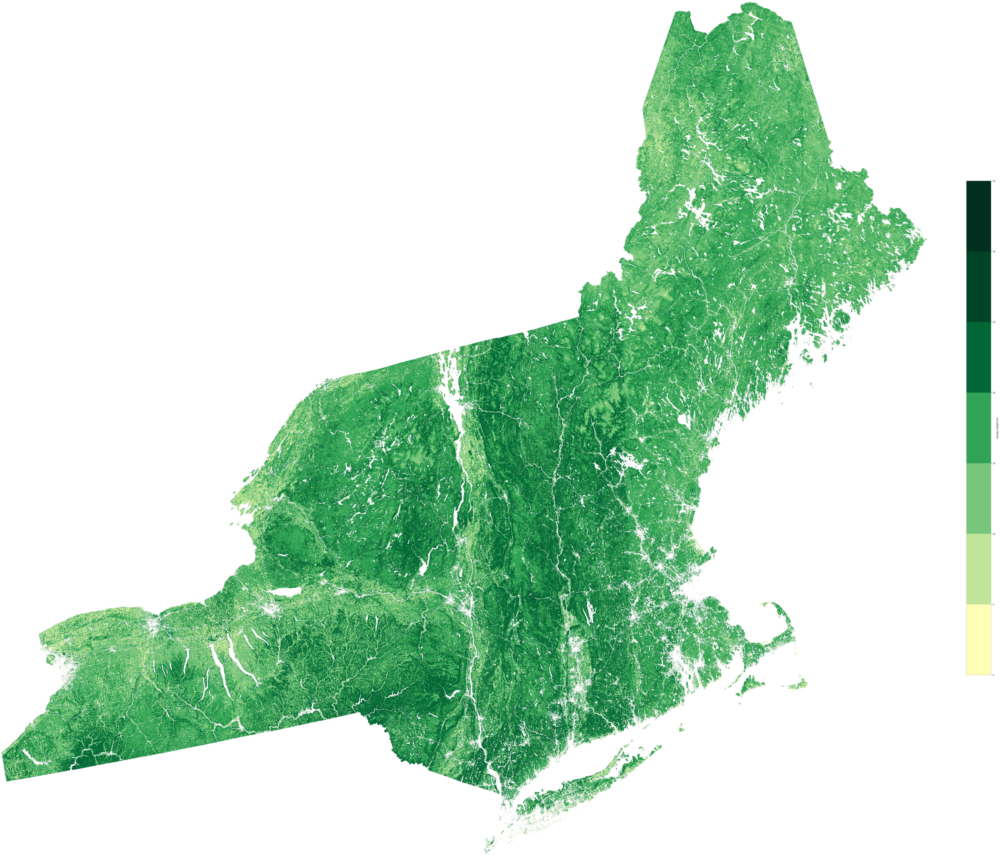

In [81]:
visualize_geotiff('NEUS.tif', 'NEUS.png')